# Colab only parts

### getting the data from the git repositry I made

In [ ]:
!git clone https://github.com/Hady051/SDC_data3

fatal: destination path 'SDC_data3' already exists and is not an empty directory.


In [ ]:
!ls SDC_data3/

driving_log.csv  IMG


In [ ]:
!pip install tensorflow==2.16.1

In [ ]:
!pip install keras==3.0

In [ ]:
!pip install pandas==2.1.4

In [ ]:
!pip3 install imgaug

# <span style="color:orange">1. Downloading the Data</span>

### <span style="color:orange">Importing the Libraries</span>

In [ ]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from IPython.core.pylabtools import figsize
from keras.models import Sequential, load_model
from keras.layers import Dense, Conv2D, MaxPooling2D, Dropout, Flatten
from keras.optimizers import Adam
import cv2
import random

### <span style="color:orange">Getting the data</span>

In [ ]:
# data_directory = "C:\\C coding projects\\Pycharm\\1. SDC 2 Final Project\\data 1"
columns = ["Center", 'Left', 'Right', 'Steering', 'Throttle', 'Reverse', 'Speed']
dataset = pd.read_csv("SDC_data3/driving_log.csv",
                      names=columns)

In [ ]:
dataset.head()

,Center,Left,Right,Steering,Throttle,Reverse,Speed
0,C:\C coding projects\Pycharm\1. SDC 2 Final Pr...,C:\C coding projects\Pycharm\1. SDC 2 Final Pr...,C:\C coding projects\Pycharm\1. SDC 2 Final Pr...,0.0,0.0,0.0,1.536327e-06
1,C:\C coding projects\Pycharm\1. SDC 2 Final Pr...,C:\C coding projects\Pycharm\1. SDC 2 Final Pr...,C:\C coding projects\Pycharm\1. SDC 2 Final Pr...,0.0,0.0,0.0,1.084547e-05
2,C:\C coding projects\Pycharm\1. SDC 2 Final Pr...,C:\C coding projects\Pycharm\1. SDC 2 Final Pr...,C:\C coding projects\Pycharm\1. SDC 2 Final Pr...,0.0,0.0,0.0,1.194282e-05
3,C:\C coding projects\Pycharm\1. SDC 2 Final Pr...,C:\C coding projects\Pycharm\1. SDC 2 Final Pr...,C:\C coding projects\Pycharm\1. SDC 2 Final Pr...,0.0,0.0,0.0,1.280762e-05
4,C:\C coding projects\Pycharm\1. SDC 2 Final Pr...,C:\C coding projects\Pycharm\1. SDC 2 Final Pr...,C:\C coding projects\Pycharm\1. SDC 2 Final Pr...,0.0,0.0,0.0,2.554898e-07


In [ ]:
import ntpath

def path_leaf(path):
    head, tail = ntpath.split(path)
    return tail

In [ ]:
dataset['Center'] = dataset['Center'].apply(path_leaf)
dataset['Left'] = dataset['Left'].apply(path_leaf)
dataset['Right'] = dataset['Right'].apply(path_leaf)

In [ ]:
dataset.head()

,Center,Left,Right,Steering,Throttle,Reverse,Speed
0,center_2025_02_18_19_08_27_122.jpg,left_2025_02_18_19_08_27_122.jpg,right_2025_02_18_19_08_27_122.jpg,0.0,0.0,0.0,1.536327e-06
1,center_2025_02_18_19_08_27_210.jpg,left_2025_02_18_19_08_27_210.jpg,right_2025_02_18_19_08_27_210.jpg,0.0,0.0,0.0,1.084547e-05
2,center_2025_02_18_19_08_27_291.jpg,left_2025_02_18_19_08_27_291.jpg,right_2025_02_18_19_08_27_291.jpg,0.0,0.0,0.0,1.194282e-05
3,center_2025_02_18_19_08_27_379.jpg,left_2025_02_18_19_08_27_379.jpg,right_2025_02_18_19_08_27_379.jpg,0.0,0.0,0.0,1.280762e-05
4,center_2025_02_18_19_08_27_468.jpg,left_2025_02_18_19_08_27_468.jpg,right_2025_02_18_19_08_27_468.jpg,0.0,0.0,0.0,2.554898e-07


### <span style="color:orange">Creating a Histogram Plot for the Steering angle data</span>

In [ ]:
# bins_number = 25
bins_number = 29
hist, bins = np.histogram(dataset['Steering'], bins_number)
center = (bins[:-1] + bins[1:]) * 0.5
# print(bins)

<BarContainer object of 29 artists>

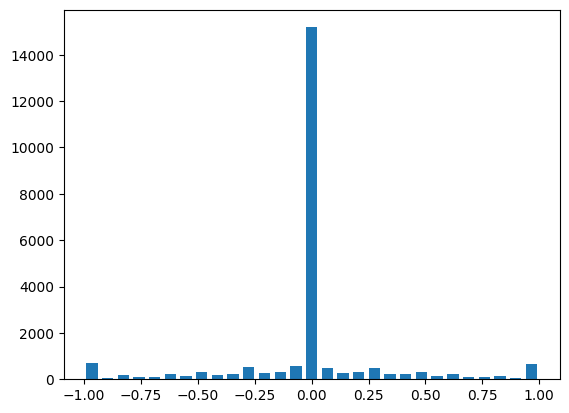

In [ ]:
plt.bar(center, hist, width=0.05)

### <span style="color:orange">Specifying the Samples Per Bin</span>

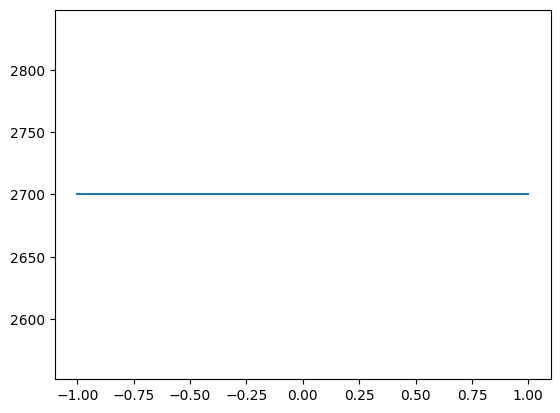

In [ ]:
# samples_per_bin = 200   # // every pin can only have 200 samples

# samples_per_bin = 320

samples_per_bin = 2700

plt.plot((np.min(dataset['Steering']), np.max(dataset['Steering']) ), (samples_per_bin, samples_per_bin) )

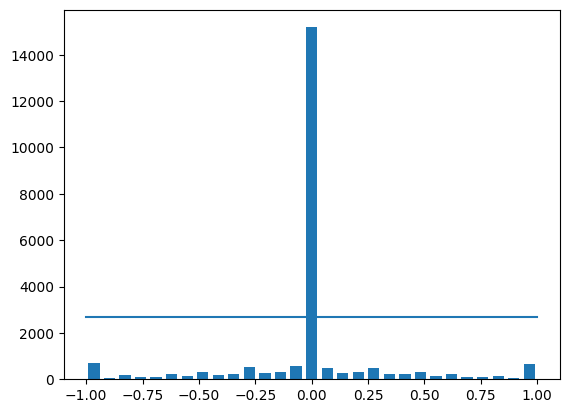

In [ ]:
plt.bar(center, hist, width=0.05)

plt.plot((np.min(dataset['Steering']), np.max(dataset['Steering']) ), (samples_per_bin, samples_per_bin) )

___

# <span style="color:orange">2. Balancing the Data</span>


### <span style="color:orange">Removing the Samples above the threshold (samples_per_bin) Line</span>

In [ ]:
from sklearn.utils import shuffle

print("total samples in the dataset:", len(dataset) ) # // no. of rows
remove_list = []

for j in range(bins_number):
    list_ = []
    for i in range(len(dataset['Steering']) ):
        if dataset['Steering'][i] >= bins[j] and dataset["Steering"][i] <= bins[j + 1]:
            list_.append(i)
    list_ = shuffle(list_)
    list_ = list_[samples_per_bin: ]
    remove_list.extend(list_)

print("removed:", len(remove_list) )
dataset.drop(dataset.index[remove_list], inplace=True)
print("remaining:", len(dataset) )

total samples in the dataset: 22890
removed: 12482
remaining: 10408


In [ ]:
print(dataset.shape)

(10408, 7)


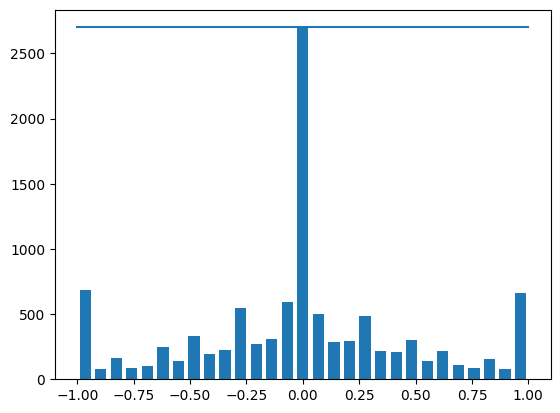

In [ ]:
hist, bins = np.histogram(dataset['Steering'], bins_number)

plt.bar(center, hist, width=0.05)

plt.plot((np.min(dataset['Steering']), np.max(dataset['Steering']) ), (samples_per_bin, samples_per_bin) )

___

# <span style="color:orange">3. Training & Validation Split</span>

### <span style="color:orange">Loading the Images with the Steering Angles as Labels</span>

In [ ]:
print(dataset.iloc[1] )

Center      center_2025_02_18_19_08_28_222.jpg
Left          left_2025_02_18_19_08_28_222.jpg
Right        right_2025_02_18_19_08_28_222.jpg
Steering                                   0.0
Throttle                                   0.0
Reverse                                    0.0
Speed                                 0.000024
Name: 13, dtype: object


In [ ]:
def load_images_steering_angles(datadir, dataframe):
    images_path = []
    steering_angles = []

    # center_imgs = dataframe.iloc[ : , 0].values
    # left_imgs = dataframe.iloc[ : , 1].values
    # right_imgs = dataframe.iloc[ : , 2].values
    # steering_angles = dataframe.iloc[ : , 3].values

    for i in range(len(dataframe) ):
        indexed_data = dataframe.iloc[i]
        center_imgs, left_imgs, right_imgs = indexed_data[0], indexed_data[1], indexed_data[2]
        images_path.append(os.path.join(datadir, center_imgs.strip() ) )
        steering_angles.append(float(indexed_data[3]) )

        ##'''
        # / left image append
        images_path.append(os.path.join(datadir, left_imgs.strip() ) )
        steering_angles.append(float(indexed_data[3] + 0.15) )
        ##
        # / right image append
        images_path.append(os.path.join(datadir, right_imgs.strip() ) )
        steering_angles.append(float(indexed_data[3] - 0.15) )
        ##'''

    images_path_array = np.asarray(images_path)
    steering_angles_array = np.asarray(steering_angles)

    return images_path_array, steering_angles_array

#### Colab

In [ ]:
# data_directory = "/content/drive/MyDrive/Colab Notebooks/SDC 2: Running models/section 14: SDC project/data 3"
images_directory = "SDC_data3/IMG"

images_path, steering_angles = load_images_steering_angles(datadir=images_directory, dataframe=dataset)

/tmp/ipython-input-21-3670591948.py:12: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  center_imgs, left_imgs, right_imgs = indexed_data[0], indexed_data[1], indexed_data[2]
/tmp/ipython-input-21-3670591948.py:14: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  steering_angles.append(float(indexed_data[3]) )
/tmp/ipython-input-21-3670591948.py:19: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  steering_angles.append(float(indexed_data[3

In [ ]:
# data_directory = "C:\\C coding projects\\Pycharm\\1. SDC 2 Final Project\\data 1"
# images_directory = "C:\\C coding projects\\Pycharm\\1. SDC 2 Final Project\\data 1\\IMG"

# images_path, steering_angles = load_images_steering_angles(datadir=images_directory, dataframe=dataset)

### <span style="color:orange">Splitting the Data and Plotting it</span>

In [ ]:
from sklearn.model_selection import train_test_split

# X: images, y: dv (labels) (steering angles)
(train_images, test_images,
dv_train, dv_test) = train_test_split(images_path, steering_angles, test_size=0.2, random_state=11)

In [ ]:
print(f'Training samples: {len(train_images)}')
print(f'Test samples: {len(test_images)}')

Training samples: 24979
Test samples: 6245


(array([132., 150.,  30., 191.,  44., 139., 163.,  82., 199., 116., 289.,
        304., 667., 348., 662., 311., 652., 287., 236., 133., 199., 107.,
        128., 128.,  49., 180.,  23., 153., 143.]),
 array([-1.15      , -1.07068966, -0.99137931, -0.91206897, -0.83275862,
        -0.75344828, -0.67413793, -0.59482759, -0.51551724, -0.4362069 ,
        -0.35689655, -0.27758621, -0.19827586, -0.11896552, -0.03965517,
         0.03965517,  0.11896552,  0.19827586,  0.27758621,  0.35689655,
         0.4362069 ,  0.51551724,  0.59482759,  0.67413793,  0.75344828,
         0.83275862,  0.91206897,  0.99137931,  1.07068966,  1.15      ]),
 <BarContainer object of 29 artists>)

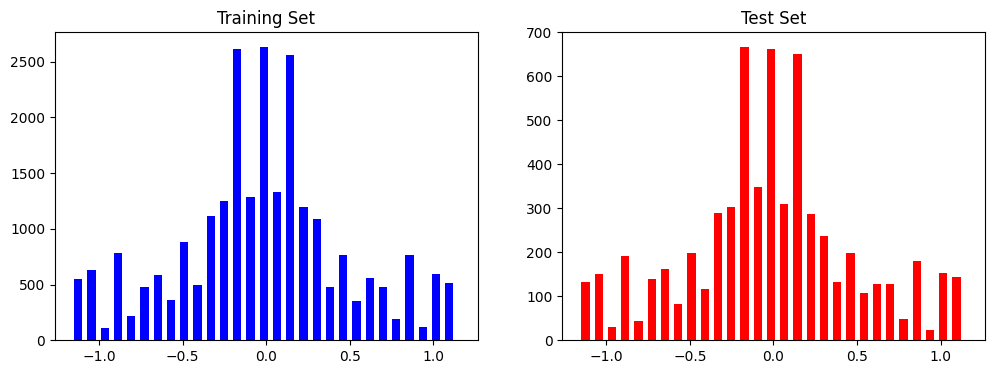

In [ ]:
fig, axis = plt.subplots(1, 2, figsize=(12, 4) )

axis[0].set_title("Training Set")
axis[0].hist(dv_train, bins=bins_number, width=0.05, color='blue')

axis[1].set_title("Test Set")
axis[1].hist(dv_test, bins=bins_number, width=0.05, color="red")

****You can change the random_state or try making a new dataset to change these plots to be balanced better**

****for data 1, from the pics, it seems that random_state=0, 4, 5, 8 look the best**

___

# <span style="color:orange">6. Generator - Augmentation Techniques</span>

### <span style="color:orange">Importing the Libraries</span>

In [ ]:
from imgaug import augmenters as iaa

import matplotlib.image as mpimg

### <span style="color:orange">Zooming Augmentation</span>

In [ ]:
def img_random_zoom(img):
    zoom = iaa.Affine(scale=(1, 1.3) )
    img = zoom.augment_image(img)
    return img

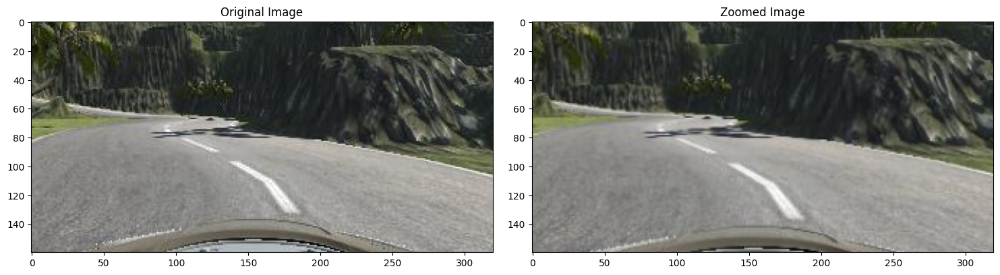

In [ ]:
random_image_path = images_path[random.randint(0, len(images_path) - 1) ]

original_image = mpimg.imread(random_image_path)
zoomed_image = img_random_zoom(original_image)


fig, axis = plt.subplots(nrows=1, ncols=2, figsize=(15, 10) )
fig.tight_layout()

axis[0].set_title("Original Image")
axis[0].imshow(original_image)

axis[1].set_title("Zoomed Image")
axis[1].imshow(zoomed_image)

### <span style="color:orange">Panning Augmentation</span>

In [ ]:
def img_random_pan(img):
    pan = iaa.Affine(translate_percent={"x": (-0.1, 0.1), "y": (-0.1, 0.1) } )
    img = pan.augment_image(img)
    return img

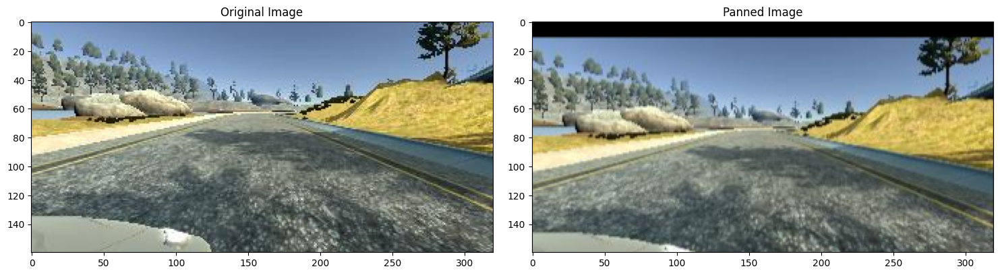

In [ ]:
random_image_path = images_path[random.randint(0, len(images_path) - 1) ]

original_image = mpimg.imread(random_image_path)
panned_image = img_random_pan(original_image)


fig, axis = plt.subplots(nrows=1, ncols=2, figsize=(15, 10) )
fig.tight_layout()

axis[0].set_title("Original Image")
axis[0].imshow(original_image)

axis[1].set_title("Panned Image")
axis[1].imshow(panned_image)

### <span style="color:orange">Brightness Augmentation</span>

In [ ]:
def img_random_brightness(img):
    brightness = iaa.Multiply(mul=(0.4, 1.2) )
    img = brightness.augment_image(img)
    return img

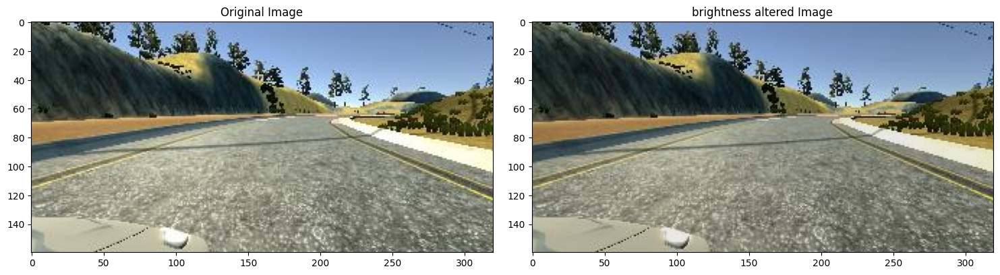

In [ ]:
random_image_path = images_path[random.randint(0, len(images_path) - 1) ]

original_image = mpimg.imread(random_image_path)
brightness_altered_image = img_random_brightness(original_image)


fig, axis = plt.subplots(nrows=1, ncols=2, figsize=(15, 10) )
fig.tight_layout()

axis[0].set_title("Original Image")
axis[0].imshow(original_image)

axis[1].set_title("brightness altered Image")
axis[1].imshow(brightness_altered_image)

### <span style="color:orange">Flipping Augmentation</span>

In [ ]:
def img_random_flip(img, flipped_steering_angle):
    img = cv2.flip(img, 1)
    flipped_steering_angle = -flipped_steering_angle
    return img, flipped_steering_angle

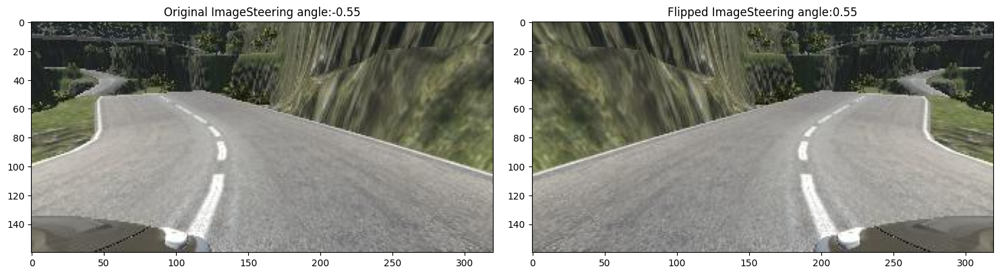

In [ ]:
random_index = random.randint(0, len(images_path) - 1)
random_image_path = images_path[random_index]
steering_angle = steering_angles[random_index]

original_image = mpimg.imread(random_image_path)
flipped_image, flipped_steering_angle = img_random_flip(img=original_image,
                                                        flipped_steering_angle=steering_angle)


fig, axis = plt.subplots(nrows=1, ncols=2, figsize=(15, 10) )
fig.tight_layout()

axis[0].set_title("Original Image" + "Steering angle:" + str(steering_angle) )
axis[0].imshow(original_image)

axis[1].set_title("Flipped Image" + "Steering angle:" + str(flipped_steering_angle) )
axis[1].imshow(flipped_image)

### <span style="color:orange">Making the Augmentation Function</span>

In [ ]:
def random_augment(img, img_steering_angle):
    img = mpimg.imread(img)
    if np.random.rand() < 0.5:
        img = img_random_zoom(img)
    if np.random.rand() < 0.5:
        img = img_random_pan(img)
    if np.random.rand() < 0.5:
        img = img_random_brightness(img)
    if np.random.rand() < 0.5:
        img, img_steering_angle = img_random_flip(img=img, flipped_steering_angle=img_steering_angle)

    return img, img_steering_angle

### <span style="color:orange">Plotting a sample of Augmented Pics</span>

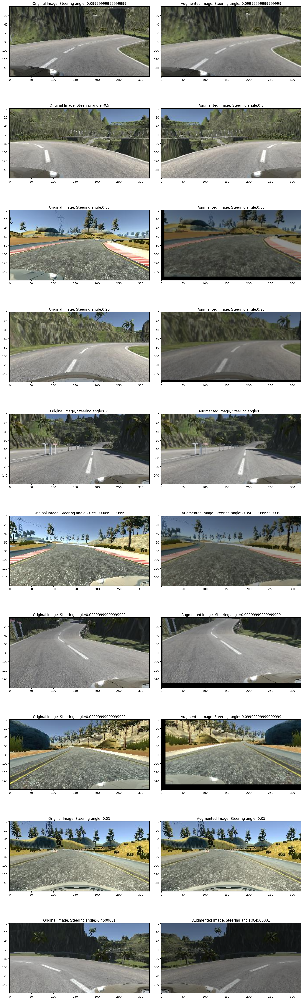

In [ ]:
ncols = 2
nrows = 10

fig, axis = plt.subplots(nrows=nrows, ncols=ncols, figsize=(15, 50) )
fig.tight_layout()

for row in range(nrows): # // 10
    random_num = random.randint(0, len(images_path) - 1)
    random_image = images_path[random_num]
    random_image_steering = steering_angles[random_num]

    original_image = mpimg.imread(random_image)
    augmented_image, aug_image_steering = random_augment(img=random_image,
                                                     img_steering_angle=random_image_steering)

    axis[row][0].set_title("Original Image, " + "Steering angle:" + str(random_image_steering) )
    axis[row][0].imshow(original_image)

    axis[row][1].set_title("Augmented Image, " + "Steering angle:" + str(aug_image_steering) )
    axis[row][1].imshow(augmented_image)

___

# <span style="color:orange">4. Preprocessing Images</span>

In [ ]:
# import matplotlib.image as mpimg

def img_preprocessing(img_path):
    # img = mpimg.imread(img_path) (removed it for the batch generator part)

    img = img_path[60:135, :, :]

    img = cv2.cvtColor(img, cv2.COLOR_RGB2YUV)

    img = cv2.GaussianBlur(img, ksize=(3, 3), sigmaX=0, sigmaY=0)

    img = cv2.resize(img, dsize=(200, 66) )

    img = img / 255

    return img

In [ ]:
random_image_path = images_path[100]

original_image = mpimg.imread(random_image_path)

preprocessed_image = img_preprocessing(original_image)

In [ ]:
original_image.shape

(160, 320, 3)

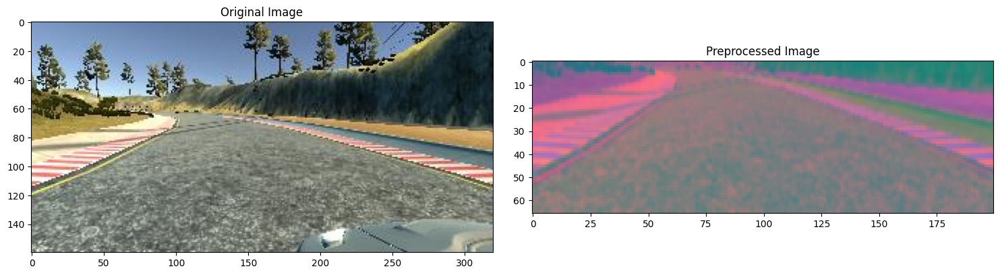

In [ ]:
fig, axis = plt.subplots(nrows=1, ncols=2, figsize=(15, 10) )
fig.tight_layout()

axis[0].set_title("Original Image")
axis[0].imshow(original_image)

axis[1].set_title("Preprocessed Image")
axis[1].imshow(preprocessed_image)

# <span style="color:orange">7. Batch Generator Function</span>

### <span style="color:orange">Defining the Function that will Give New Batches of Augmented Images</span>

In [ ]:
def img_batch_generator(img_path, img_steering_angle, batch_size, is_training):
    while True:
        batch_images = []
        batch_steering_angles = []

        for i in range(batch_size):
            random_index = random.randint(0, int(len(img_path) - 1) )

            if is_training:  ## Training data
                image, image_steering_angle = random_augment(img_path[random_index],
                                                             img_steering_angle[random_index])

            else: ## Validation data (Test data)
                image = mpimg.imread(img_path[random_index])
                image_steering_angle = img_steering_angle[random_index]

            image = img_preprocessing(image)

            batch_images.append(image)
            batch_steering_angles.append(image_steering_angle)

        yield (np.asarray(batch_images), np.asarray(batch_steering_angles) )

___

# <span style="color:orange">8. Fit Generator</span>

### <span style="color:orange">Trying the batch generator by using next Statement</span>

In [ ]:
train_images_gen, dv_train_gen = next(img_batch_generator(img_path=train_images,
                                                          img_steering_angle=dv_train,
                                                          batch_size=1, is_training=1) )

test_images_gen, dv_test_gen = next(img_batch_generator(img_path=test_images,
                                                        img_steering_angle=dv_test,
                                                        batch_size=1, is_training=0) )

### <span style="color:orange">Plotting an Example of the Train Set Batch and Test Set Batch to See the Difference
</span>

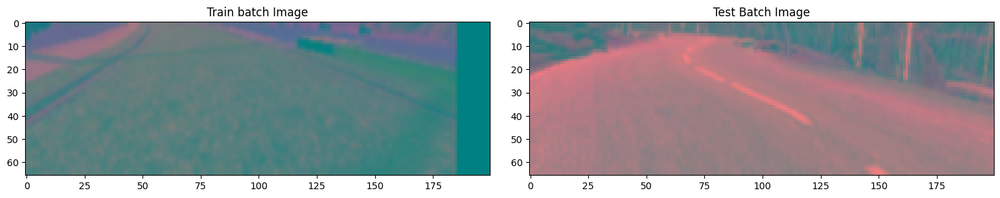

In [ ]:
fig, axis = plt.subplots(nrows=1, ncols=2, figsize=(15, 10) )
fig.tight_layout()

axis[0].set_title("Train batch Image")
axis[0].imshow(train_images_gen[0])

axis[1].set_title("Test Batch Image")
axis[1].imshow(test_images_gen[0])

___

In [ ]:
# train_images = np.array(list(map(img_preprocessing, train_images) ) )
# test_images = np.array(list(map(img_preprocessing, test_images) ) )

### <span style="color:orange">Printing a random picture from the train images after preprocessing them</span>

In [ ]:
# plt.imshow(train_images[random.randint(0, len(train_images) - 1) ] )
# plt.axis("off")
# print(train_images.shape)

___

# <span style="color:orange">5. Defining NVIDIA Model</span>

### <span style="color:orange">Adding Layers and Compiling the Model</span>

In [ ]:
from keras.layers import Convolution2D  # // similar to Conv 2D I think but for consistence with the arch.

def nvidia_model():
    model = Sequential()

    ### Model Layers
    ## CONV layers
    model.add(Convolution2D(input_shape=(66, 200, 3),
                            filters=24, kernel_size=(5, 5), strides=2, padding="same",
                            activation="elu") )
    model.add(Convolution2D(input_shape=(66, 200, 3),
                            filters=24, kernel_size=(5, 5), strides=1, padding="same",
                            activation="elu") )

    model.add(Convolution2D(filters=36, kernel_size=(5, 5), strides=2, padding="same",
                            activation="elu") )
    model.add(Convolution2D(filters=36, kernel_size=(5, 5), strides=1, padding="same",
                            activation="elu") )

    model.add(Convolution2D(filters=48, kernel_size=(5, 5), strides=2, padding="same",
                            activation="elu") )
    model.add(Convolution2D(filters=48, kernel_size=(5, 5), strides=1, padding="same",
                            activation="elu") )

    model.add(Convolution2D(filters=64, kernel_size=(3, 3), strides=1, padding="same",
                            activation="elu") )
    model.add(Convolution2D(filters=64, kernel_size=(3, 3), strides=1, padding="same",
                            activation="elu") )
    model.add(Convolution2D(filters=64, kernel_size=(3, 3), strides=1, padding="same",
                            activation="elu") )
    model.add(Convolution2D(filters=64, kernel_size=(3, 3), strides=1, padding="same",
                            activation="elu") )
    ## Dropout Layer
    # model.add(Dropout(rate=0.5) )

    ## Flatten layer
    model.add(Flatten() )
    ## ANN Layer
    model.add(Dense(units=100, activation="elu") )
    ## Dropout Layer
    # model.add(Dropout(rate=0.5) )

    ## ANN Layer
    model.add(Dense(units=50, activation="elu") )
    ## Dropout Layer
    # model.add(Dropout(rate=0.5) )

    ## ANN layer
    model.add(Dense(units=10, activation="elu") )
    ## Dropout Layer
    # model.add(Dropout(rate=0.5) )

    ## Output layer (predicting the steering angle)
    model.add(Dense(units=1) )


    ### Compiling the Model
    model.compile(optimizer=Adam(learning_rate=0.00001), loss="mse")

    return model

In [ ]:
nn_model = nvidia_model()

print(nn_model.summary() )

/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:99: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape              ┃    Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 33, 100, 24)       │      1,824 │
├─────────────────────────────────┼───────────────────────────┼────────────┤
│ conv2d_1 (Conv2D)               │ (None, 33, 100, 24)       │     14,424 │
├─────────────────────────────────┼───────────────────────────┼────────────┤
│ conv2d_2 (Conv2D)               │ (None, 17, 50, 36)        │     21,636 │
├─────────────────────────────────┼───────────────────────────┼────────────┤
│ conv2d_3 (Conv2D)               │ (None, 17, 50, 36)        │     32,436 │
├─────────────────────────────────┼───────────────────────────┼────────────┤
│ conv2d_4 (Conv2D)               │ (None, 9, 25, 48)         │     43,248 │
├─────────────────────────────────┼───────────────────────────┼────────────┤
│ conv2d_5 (Conv2D)               │ (None, 9, 25, 48)         │     57,648 │
├─────────────────────────────────┼───────────────────────────┼────────────┤
│ conv2d_6 (Conv2D)               │ (None, 9, 25, 64)         │     27,712 │
├─────────────────────────────────┼───────────────────────────┼────────────┤
│ conv2d_7 (Conv2D)               │ (None, 9, 25, 64)         │     36,928 │
├─────────────────────────────────┼───────────────────────────┼────────────┤
│ conv2d_8 (Conv2D)               │ (None, 9, 25, 64)         │     36,928 │
├─────────────────────────────────┼───────────────────────────┼────────────┤
│ conv2d_9 (Conv2D)               │ (None, 9, 25, 64)         │     36,928 │
├─────────────────────────────────┼───────────────────────────┼────────────┤
│ flatten (Flatten)               │ (None, 14400)             │          0 │
├─────────────────────────────────┼───────────────────────────┼────────────┤
│ dense (Dense)                   │ (None, 100)               │  1,440,100 │
├─────────────────────────────────┼───────────────────────────┼────────────┤
│ dense_1 (Dense)                 │ (None, 50)                │      5,050 │
├─────────────────────────────────┼───────────────────────────┼────────────┤
│ dense_2 (Dense)                 │ (None, 10)                │        510 │
├─────────────────────────────────┼───────────────────────────┼────────────┤
│ dense_3 (Dense)                 │ (None, 1)                 │         11 │
└─────────────────────────────────┴───────────────────────────┴────────────┘

 Total params: 1,755,383 (6.70 MB)

 Trainable params: 1,755,383 (6.70 MB)

 Non-trainable params: 0 (0.00 B)

None


### <span style="color:orange">Fitting the Model</span>

In [ ]:
# nn_model_fit = nn_model.fit(x=train_images, y=dv_train, validation_data=(test_images, dv_test),
#                                 epochs=32, batch_size=120, shuffle=True, verbose=True)

### <span style="color:orange">Fitting the Generator Model</span>

In [ ]:
train_images.shape[0]

24979

In [ ]:
train_images.shape[0] // 50

499



---



#### Loading the previous n epochs model

In [ ]:
nn_model = load_model('/content/3.CNN_modified_nvidia_model_CLR_images_aug_460_epochs_CLR.keras')



---



In [ ]:
nn_model_fit_generator = nn_model.fit(img_batch_generator(img_path=train_images,
                                                          img_steering_angle=dv_train,
                                                          batch_size=100,
                                                          is_training=1),
                                      steps_per_epoch=int(train_images.shape[0] // 50),
                                      validation_data=(img_batch_generator(test_images, dv_test, batch_size=100, is_training=0) ),
                                      validation_steps=200,
                                      epochs=15, verbose=1, shuffle=1)

Epoch 1/15
499/499 ━━━━━━━━━━━━━━━━━━━━ 1897s 4s/step - loss: 0.0476 - val_loss: 0.0355
Epoch 2/15
499/499 ━━━━━━━━━━━━━━━━━━━━ 1811s 4s/step - loss: 0.0465 - val_loss: 0.0351
Epoch 3/15
499/499 ━━━━━━━━━━━━━━━━━━━━ 1858s 4s/step - loss: 0.0469 - val_loss: 0.0359
Epoch 4/15
499/499 ━━━━━━━━━━━━━━━━━━━━ 1889s 4s/step - loss: 0.0454 - val_loss: 0.0363
Epoch 5/15
499/499 ━━━━━━━━━━━━━━━━━━━━ 1827s 4s/step - loss: 0.0457 - val_loss: 0.0360
Epoch 6/15
499/499 ━━━━━━━━━━━━━━━━━━━━ 1775s 4s/step - loss: 0.0460 - val_loss: 0.0373
Epoch 7/15
499/499 ━━━━━━━━━━━━━━━━━━━━ 1837s 4s/step - loss: 0.0469 - val_loss: 0.0365
Epoch 8/15
499/499 ━━━━━━━━━━━━━━━━━━━━ 1802s 4s/step - loss: 0.0456 - val_loss: 0.0376
Epoch 9/15
499/499 ━━━━━━━━━━━━━━━━━━━━ 1760s 4s/step - loss: 0.0442 - val_loss: 0.0367
Epoch 10/15
499/499 ━━━━━━━━━━━━━━━━━━━━ 1809s 4s/step - loss: 0.0454 - val_loss: 0.0376
Epoch 11/15
499/499 ━━━━━━━━━━━━━━━━━━━━ 1823s 4s/step - loss: 0.0455 - val_loss: 0.0372
Epoch 12/15
499/499 ━━━━━━━━━━

### <span style="color:orange">Plotting the history of the Model (Loss)</span>

Text(0.5, 0, 'Number of epochs')

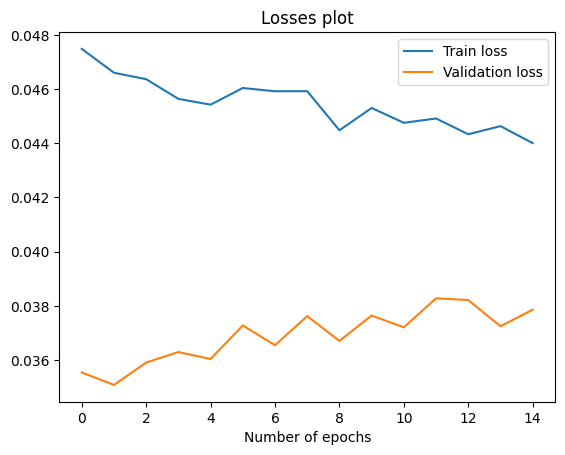

In [ ]:
plt.plot(nn_model_fit_generator.history['loss'] )
plt.plot(nn_model_fit_generator.history['val_loss'] )
plt.legend(["Train loss", "Validation loss"] )
plt.title("Losses plot")
plt.xlabel("Number of epochs")

### <span style="color:orange">Saving/Loading the Model</span>

In [ ]:
nn_model.save('3.CNN_modified_nvidia_model_CLR_images_aug_475_epochs_CLR.keras')
# nn_model = load_model('1.CNN_nvidia_model_CLR_images_aug_120_epochs_CLR.keras')

### <span style="color:orange">Downloading the Model File</span>

In [ ]:
from google.colab import files

# Download the model
files.download('3.CNN_modified_nvidia_model_CLR_images_aug_475_epochs_CLR.keras')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>



---

---




